In [21]:
import plotly.express as px
import pandas as pd
import re
import numpy as np
import matplotlib
import matplotlib.pyplot as plt


In [22]:
output_txt = "../output.txt"

In [23]:
f = open(output_txt, "r")
content = f.read()

In [24]:
#estos regex encuentran los bloques con soluciones greedy o heuristicas delimitadas
regex_greedy_sols =  re.compile(r"---\n(.*\n)*?---\n")
regex_greedy_quality = re.compile(r"PERIOD (.*?) GREEDY SOLUTION WITH QUALITY (.*?)\n")
regex_heuristic_sols = re.compile(r"===\n(.*\n)*?===\n")
regex_heuristic_quality = re.compile(r"PERIOD (.*?) HEURISTIC SOLUTION WITH QUALITY (.*?)\n")

In [25]:
regex_assignment = re.compile(
    r"V(.*?)    (.*?)    (.*?)    (.*?)    (.*?)    (.*?)    (.*?)    (.*?)    (.*?)    (.*?\(.*?\))    (.*?\(.*?\))    (.*?\(.*?\))    (.*?\(.*?\))"
)

In [26]:
periods = content.split("CURRENT PERIOD")[1:]
periods

[': 1 TIMESTAMP: 27660\n---\nPERIOD 1 GREEDY SOLUTION WITH QUALITY 14929.1\nV1    3    1    5.10496    93.3    A2    ROUND 1    MCC1    461 (7:41:0)    461 (7:41:0)    489.463 (8:9:27)    582.763 (9:42:45)    610.226 (10:10:13)    \nV2    3    3    5.10496    65    H1    ROUND 1    MCC1    461 (7:41:0)    461 (7:41:0)    472.49 (7:52:29)    537.49 (8:57:29)    545.911 (9:5:54)    \nV3    3    2    5.10496    62.14    H2    ROUND 1    MCC1    461 (7:41:0)    461 (7:41:0)    470.781 (7:50:46)    532.921 (8:52:55)    540.092 (9:0:5)    \nV4    3    2    5.10496    62.14    A1    ROUND 1    MCC1    461 (7:41:0)    461 (7:41:0)    491.185 (8:11:11)    553.325 (9:13:19)    582.511 (9:42:30)    \nV5    3    2    5.10496    62.14    H2    ROUND 2    MCC1    461 (7:41:0)    540.092 (9:0:5)    542.192 (9:2:11)    604.332 (10:4:19)    615.664 (10:15:39)    \nV6    2    2    0.895303    29.9    A4    ROUND 2    MCC2    461 (7:41:0)    552.292 (9:12:17)    573.253 (9:33:15)    603.153 (10:3:9)    6

In [27]:
q_list = []
count = 1
final_d = {}
dataframes = []
for p in periods:
    g_sol = p.split('---')[1]
    g_quality = float(re.findall(regex_greedy_quality, g_sol)[0][1])
    try:
        h_sol = p.split('===')[1]
        h_quality = float(re.findall(regex_heuristic_quality, h_sol)[0][1])
        q_list.append([count,g_quality, h_quality, ((g_quality-h_quality)/g_quality)*100])
    except:
        q_list.append([count,g_quality, 0, 0])
    matches = re.findall(regex_assignment, g_sol)
    aux = []
    final_d = {}
    for match in matches:
        d = {}
        d["P"] = count
        d["Victim"] = "V" + str(match[0])
        d["G"] = int(match[1])
        d["A"] = int(match[2])
        d["λ"] = float(match[3])
        d["Veh"] = match[5]
        d["Hos"] = match[7]
        d["App"] = float(match[8].split(" ")[0])
        d["S"] = float(match[9].split(" ")[0])
        d["F"] =float(match[-1].split(" ")[0])
        d["Dur"] = d["F"] - d["App"]
        d["Wait"] = d["S"] - d["App"]
        d["TS_S"] = match[9].split(" ")[1].strip("(").strip(")")
        d["TS_F"] = match[-1].split(" ")[1].strip("(").strip(")")
        aux.append(d)
        final_d["V" + str(match[0])] = d
    p_df = pd.DataFrame(aux)
    dataframes.append(p_df)
    count += 1

df_calidades = pd.DataFrame(q_list, columns=["Periodo", "Calidad Greedy", "Calidad Post-Heuristica", "\\% de Diferencia"])

### Diferencias de calidades entre solucion greedy y heuristica

In [28]:
df_calidades

,Periodo,Calidad Greedy,Calidad Post-Heuristica,\% de Diferencia
0,1,14929.1,14489.6,2.943915
1,2,27278.7,26840.8,1.605282
2,3,35048.5,34963.6,0.242236
3,4,39947.1,39947.1,0.000000
4,5,39116.4,39015.6,0.257692
5,6,33339.6,33339.6,0.000000
6,7,30562.0,30562.0,0.000000


### Gantt por periodo

In [29]:
def drawGantt(name, period_df, fig_x, fig_y, draw_bars=False):
    plt.figure(figsize=(fig_x, fig_y))
    yticks = [i for i in range(len(period_df.Victim))]
    plt.title(name, size=18)

    for i in range(period_df.shape[0]):
        plt.barh(y=period_df.Victim.iloc[i], left=period_df.App.iloc[i], width=period_df.Dur.iloc[i], alpha=0.4, color='green')
        plt.barh(y=period_df.Victim.iloc[i], left=period_df.App.iloc[i], width=period_df.Wait.iloc[i], alpha=1, color='gray')
        label = (
            str(period_df.λ.iloc[i]) + " (" + str(period_df.Victim.iloc[i]) + " G=" + str(period_df.G.iloc[i]) +
            " A=" + str(period_df.A.iloc[i]) + ")" + "     Start: " + str(period_df.TS_S.iloc[i]) +
            ",  Finish: " + str(period_df.TS_F.iloc[i])
        )
        label += "  Wait: " + str("{:.3f}".format(period_df.Wait.iloc[i]))
        label += " | Vehicle: " + str(period_df.Veh.iloc[i]) + " " + period_df.Hos.iloc[i]
        plt.text(x=period_df.F.iloc[i] + 18, y=yticks[i], s=label)

    if draw_bars:
        plt.axvline(x=461, color='b')
        plt.axvline(x=566, color='b')
        plt.axvline(x=706, color='b')
        plt.axvline(x=806, color='b')
        plt.axvline(x=936, color='b')
        plt.axvline(x=1096, color='b')
        plt.axvline(x=1176, color='b')
    
    plt.grid(axis='x')
    plt.gca().invert_yaxis()
    plt.show()


#### Periodo 1



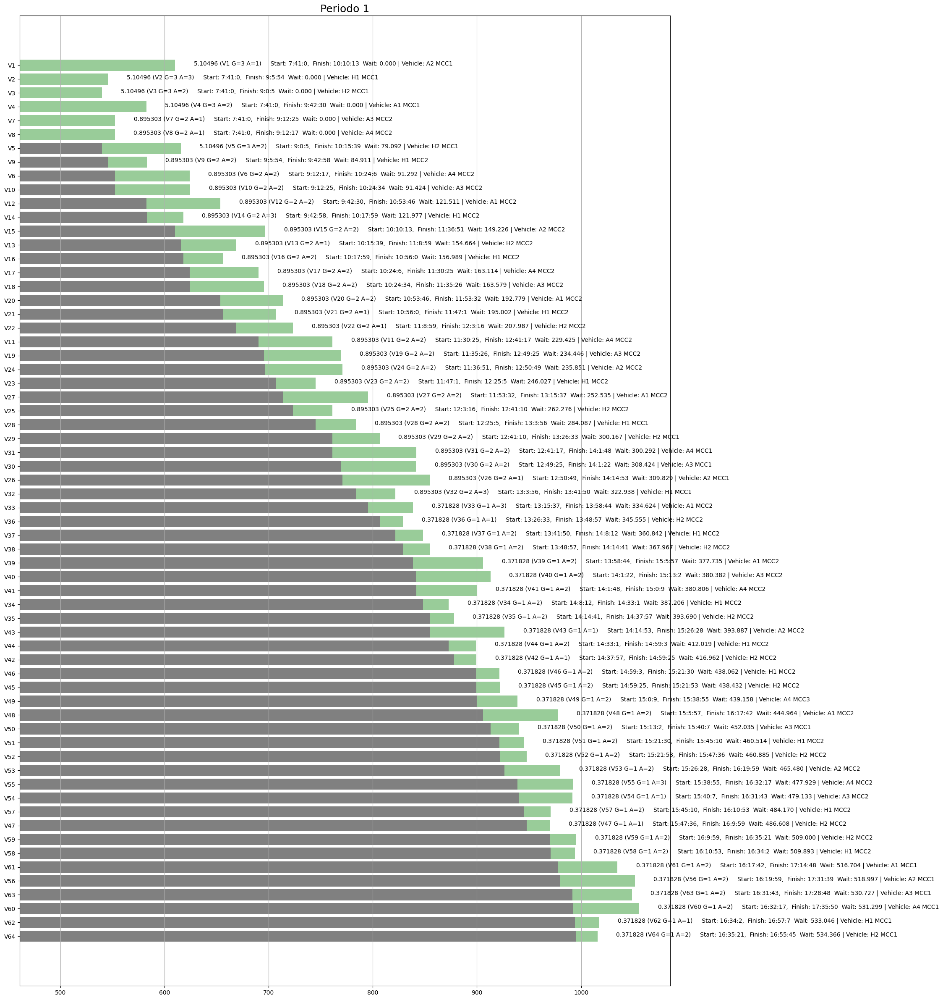

In [30]:
drawGantt("Periodo 1", dataframes[0].sort_values(by='S'),20, 30)


##### Por vehiculo

#### Periodo 2

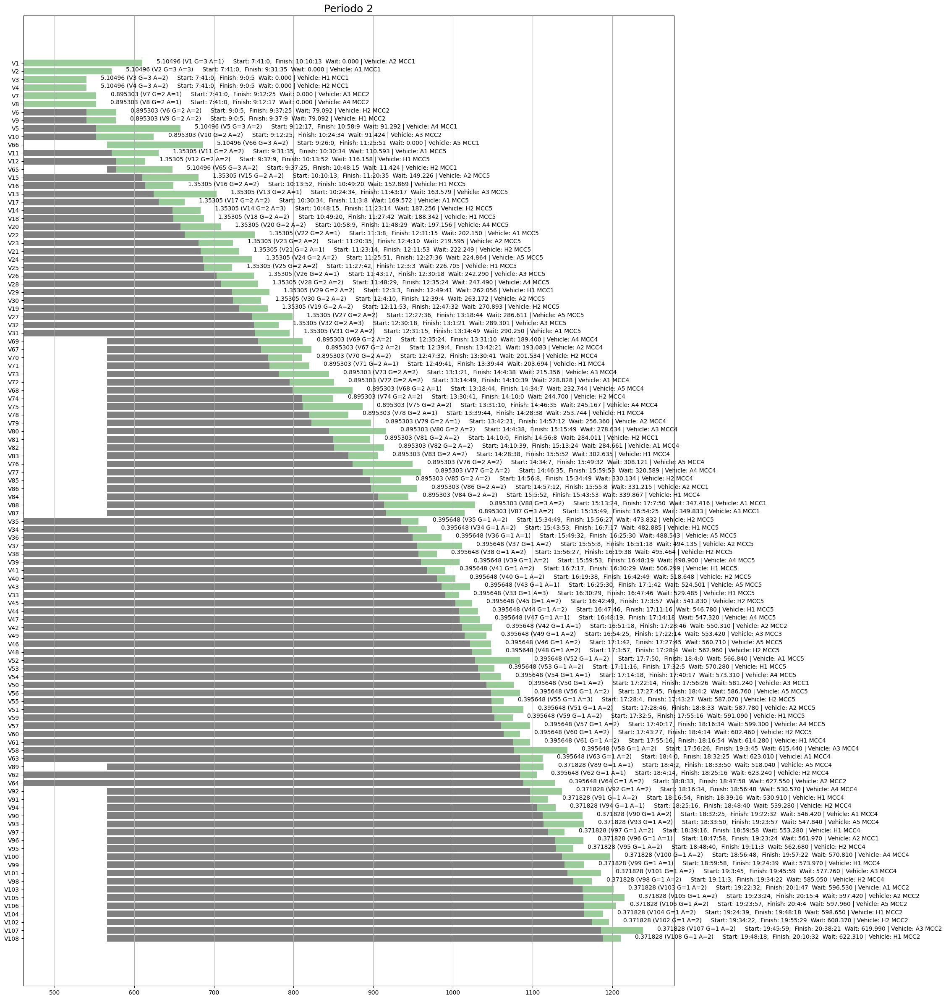

In [31]:
drawGantt("Periodo 2", dataframes[1].sort_values(by='S'),20, 30)


#### Periodo 3

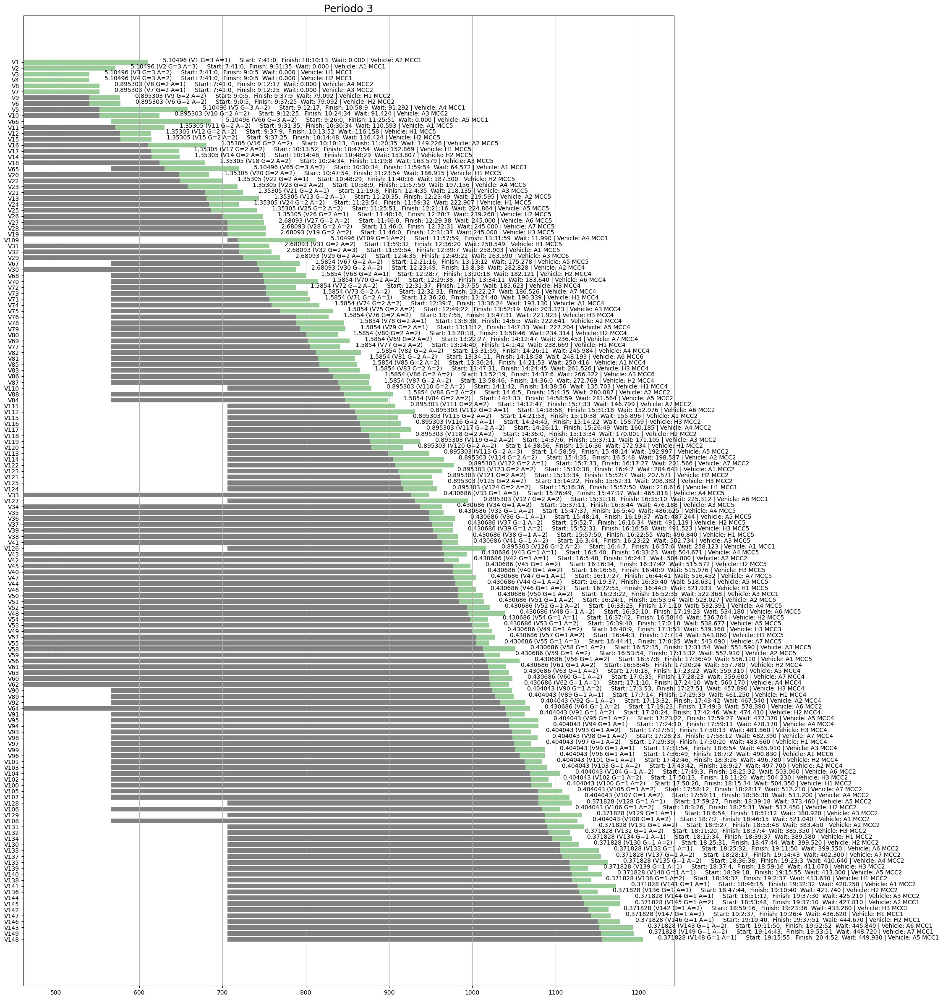

In [32]:
drawGantt("Periodo 3", dataframes[2].sort_values(by='S'),20, 30)

#### Periodo 4

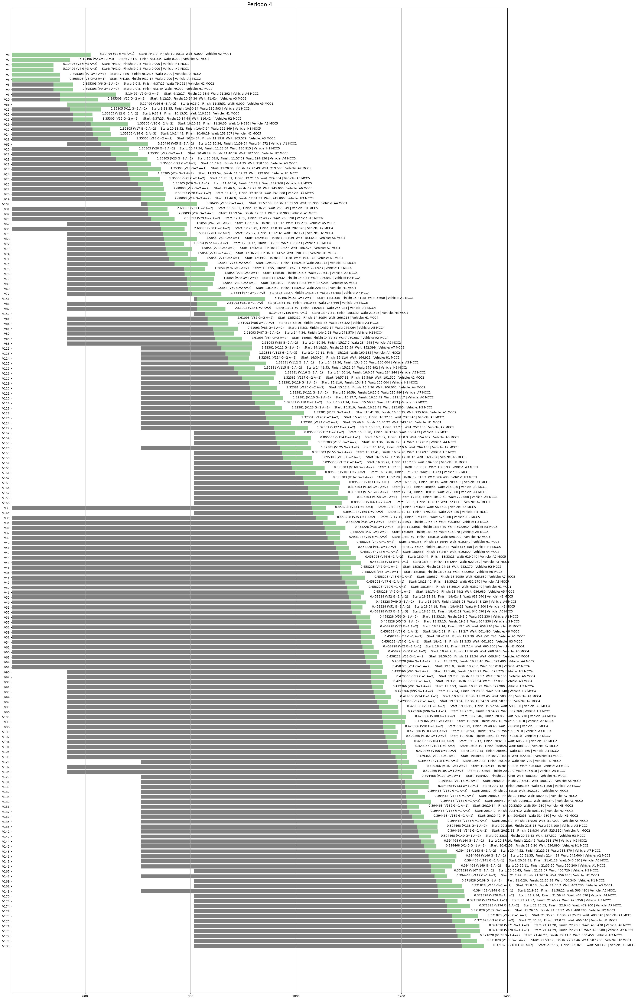

In [33]:
drawGantt("Periodo 4", dataframes[3].sort_values(by='S'),30, 60)

#### Periodo 5

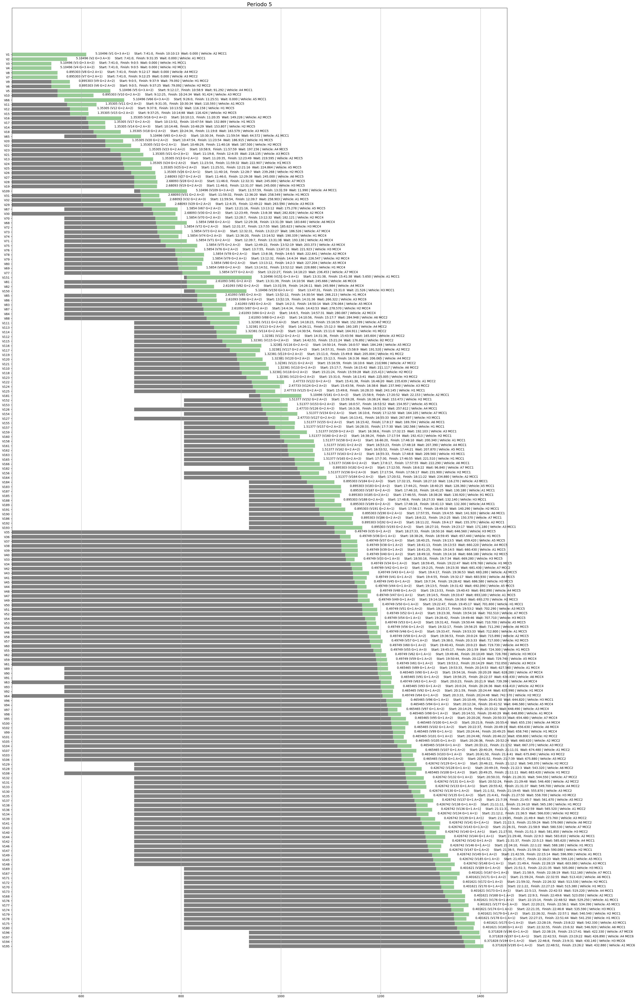

In [34]:
drawGantt("Periodo 5", dataframes[4].sort_values(by='S'),30, 60)

#### Periodo 6

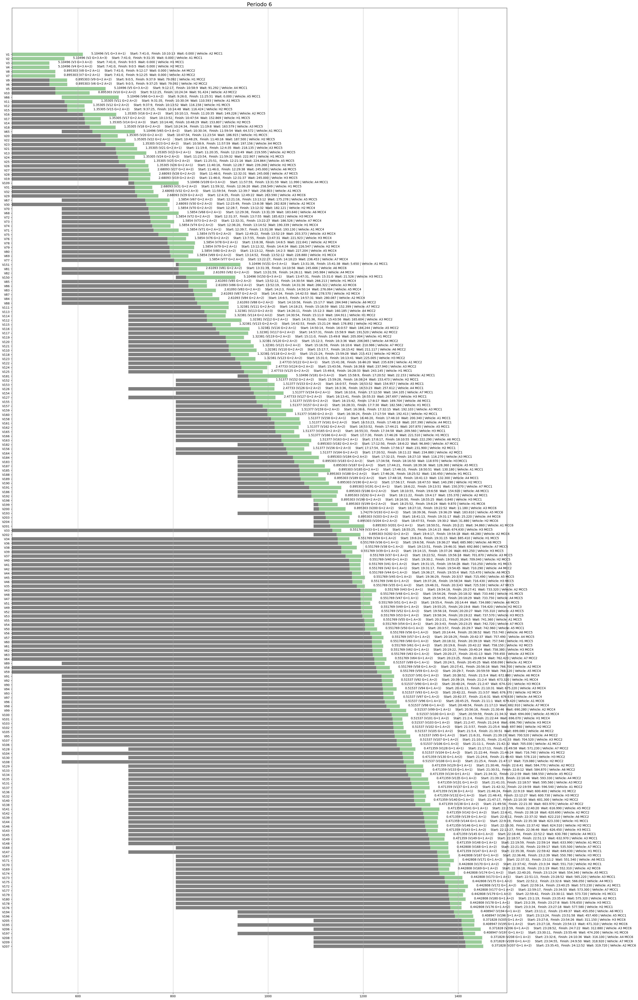

In [35]:
drawGantt("Periodo 6", dataframes[5].sort_values(by='S'),30, 60)

#### Periodo 7

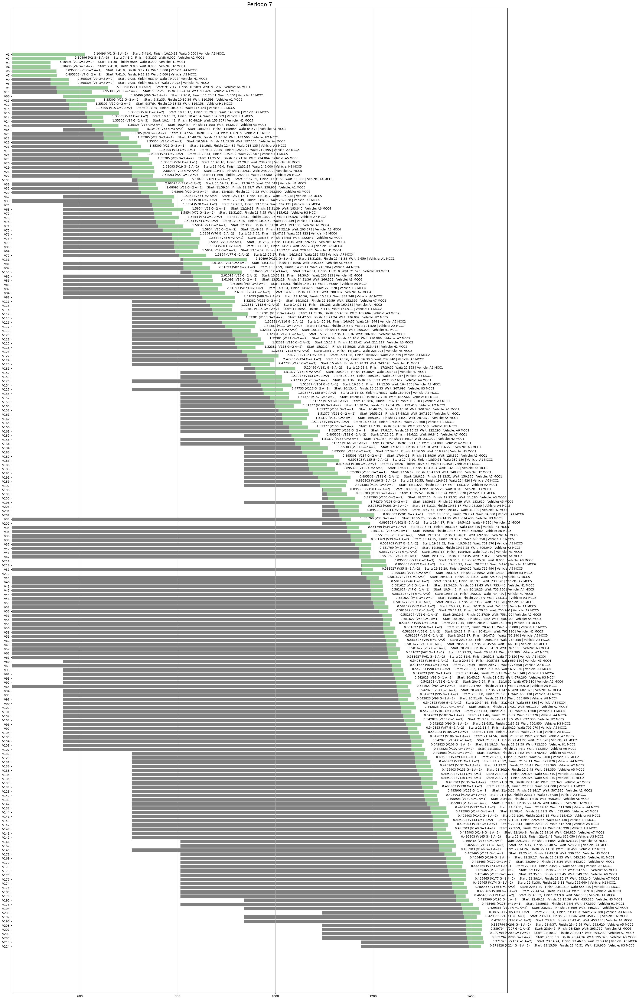

In [36]:
drawGantt("Periodo 7", dataframes[6].sort_values(by='S'),30, 60)

## Gantt por vehiculo

In [37]:
def generar_gantt_por_vehiculo(df, nombre_vehiculo):
    #plt.figure(figsize=(fig_x, fig_y))
    # Filtra el DataFrame por el nombre del vehículo
    df_vehiculo = df[df["Veh"] == nombre_vehiculo]
    # Crea una figura y ejes
    fig, ax = plt.subplots(figsize=(60, 10))

    # Configura el rango de índices para las barras
    indices = range(len(df_vehiculo))

    # Itera sobre las filas del DataFrame filtrado y dibuja las barras
    for i, row in df_vehiculo.iterrows():
        # Extrae los datos de cada fila
        victima = row["Victim"]
        duracion = row["Dur"]
        hora_inicio = row["S"]

        # Dibuja la barra correspondiente a la víctima
        ax.barh(nombre_vehiculo, left=hora_inicio, width=row["F"]-row["S"], label=victima)
        ax.text(hora_inicio + (row["F"]-row["S"]) / 2, nombre_vehiculo, victima, ha="center", va="center", color="white")
        # Incrementa los índices para la siguiente víctima
        indices = [index + duracion for index in indices]

    ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, pos: pd.to_datetime(x, unit="m").strftime("%H:%M:%S")))
    # Configura la etiqueta del eje x
    ax.set_xlabel("Hora")

    # Configura el título de la gráfica
    ax.set_title(f"Carta Gantt para el vehículo {nombre_vehiculo}")

    # Muestra la figura
    plt.show()


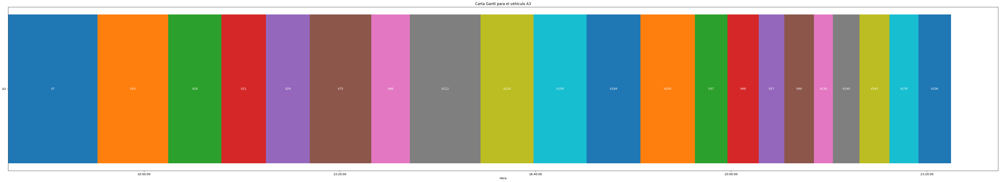

In [38]:
generar_gantt_por_vehiculo(dataframes[6].sort_values(by='S'), "A3")

## Hospitales

In [39]:
def generar_piecharts_por_hospital(df, max_camas_gravedad, nombre_hospital):
    # Filtra el DataFrame por el nombre del hospital
    df_hospital = df[df["Hos"] == nombre_hospital]

    # Crea una figura y ejes para los gráficos de tipo "pie chart"
    fig, axs = plt.subplots(1, 3, figsize=(25, 5), sharey=True)

    # Etiquetas para los niveles de gravedad
    etiquetas = ["Gravedad 1", "Gravedad 2", "Gravedad 3"]

    for i, gravedad in enumerate([1, 2, 3]):
        # Filtra el DataFrame por el nombre del hospital y el nivel de gravedad
        df_gravedad = df_hospital[df_hospital["G"] == gravedad]

        # Calcula la cantidad de camas ocupadas para el nivel de gravedad actual
        camas_ocupadas = min(len(df_gravedad), max_camas_gravedad[i]) if max_camas_gravedad[i] is not None and max_camas_gravedad[i] != 0 else 0

        # Calcula la cantidad de camas disponibles para el nivel de gravedad actual
        camas_disponibles = max_camas_gravedad[i] - camas_ocupadas if max_camas_gravedad[i] is not None and max_camas_gravedad[i] != 0 else 0

        # Genera el gráfico de tipo "pie chart" para el nivel de gravedad actual
        if max_camas_gravedad[i] is not None and max_camas_gravedad[i] != 0:
            pie_colors = ["#EA3B52", "#90EE90"]
            axs[i].pie([camas_ocupadas, camas_disponibles], labels=["Ocupadas", "Disponibles"], autopct="%1.1f%%", colors=pie_colors)
        else:
            pie_colors = ["gray"]
            axs[i].pie([1], labels=["Camas no habilitadas"], colors=pie_colors)

        # Configura el título del gráfico para el nivel de gravedad actual
        axs[i].set_title(f"Gravedad {gravedad}")

    # Configura el título general de los gráficos con mayor espacio
    fig.suptitle(f"Ocupación de Camas por Nivel de Gravedad - {nombre_hospital}", y=1.15)

    # Ajusta el espaciado vertical entre los subgráficos
    plt.subplots_adjust(hspace=0.7)

    # Calcula la posición para las leyendas
    pos_x = axs[2].get_position().x1 + 0.07

    # Agrega las leyendas a la derecha de los gráficos con padding
    for i, gravedad in enumerate([1, 2, 3]):
        # Filtra el DataFrame por el nombre del hospital y el nivel de gravedad
        df_gravedad = df_hospital[df_hospital["G"] == gravedad]

        # Calcula la cantidad de camas ocupadas para el nivel de gravedad actual
        camas_ocupadas = min(len(df_gravedad), max_camas_gravedad[i]) if max_camas_gravedad[i] is not None and max_camas_gravedad[i] != 0 else 0

        if max_camas_gravedad[i] is not None:
            # Crea la leyenda con la cantidad máxima y la cantidad ocupada de camas
            leyenda = f"Max: {max_camas_gravedad[i]}\nOcupadas: {camas_ocupadas}"
        else:
            # Crea la leyenda indicando que las camas no están habilitadas
            leyenda = "Camas no habilitadas"

        # Agrega la leyenda a la derecha del gráfico con padding
        axs[i].text(pos_x, 0.5, leyenda, transform=axs[i].transAxes, verticalalignment='center', bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round,pad=0.5'))

    # Muestra los gráficos
    plt.show()


#### Periodo 1


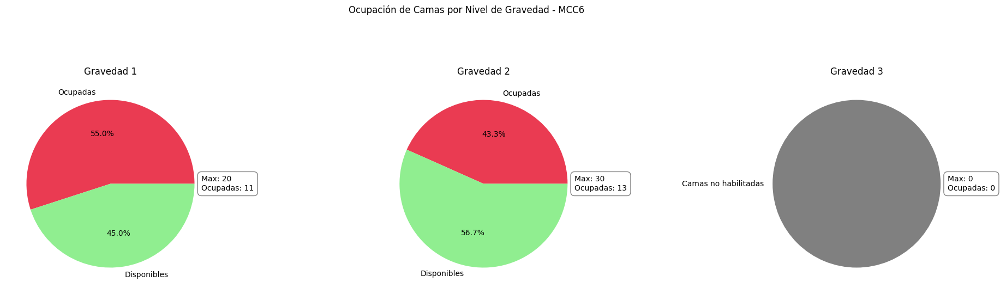

In [40]:
generar_piecharts_por_hospital(dataframes[6], [20,30,0], "MCC6")

#### Perido 2

#### Perido 3

#### Perido 4

#### Perido 5


#### Perido 6

#### Perido 7
